# New York City Restaurants: Health Code Violations

### Load Libraries

In [8]:
import matplotlib.pyplot as plt                      # visualization
import numpy as np                                   # random number generation
import pandas as pd                                  # dataframes
import descartes
# import geopandas as gpd
import nltk
# import mapclassify
# import geoplot
# from shapely.geometry import Point, Polygon
# from collections import Counter 
# from textblob import TextBlob
# from mpl_toolkits.axes_grid1 import make_axes_locatable

# inline display of plots
%matplotlib inline

### Import

##### Dataframe Import

###### Import Dataframe with col. RESTDATE (NYC Restaurant ID and Inspection Date) used for Index. 

In [12]:
df = pd.read_csv('NYC_Clean (3).csv',index_col='RESTDATE')

In [13]:
df.tail()

,DBA,BORO,ZIPCODE,Cuisine_Description,Violation_Count,Violation_Description,SCORE,GRADE,Latitude,Longitude
RESTDATE,,,,,,,,,,
4.171280e+12,ZYMI BAR & GRILL,Bronx,10467,American,3,Evidence of rats or live rats present in facil...,12,NaN,40.85957,-73.8663
5.000110e+12,ZZ CLAM BAR,Manhattan,10012,American,4,Filth flies or food/refuse/sewage-associated (...,25,B,40.72765,-74.0003
5.000110e+12,ZZ CLAM BAR,Manhattan,10012,American,4,Letter Grade or Grade Pending card not conspic...,12,A,40.72765,-74.0003
4.170270e+12,ZZ'S PIZZA & GRILL,Staten Island,10301,Pizza,2,"Food contact surface not properly washed, rins...",15,B,40.64373,-74.0728
4.170270e+12,ZZ'S PIZZA & GRILL,Staten Island,10301,Pizza,3,Plumbing not properly installed or maintained;...,22,NaN,40.64373,-74.0728


##### Create GeoDataframe for Map Overlays

In [5]:
crs = {'init': 'epsg:4326'}

In [6]:
geometry = [Point(xy) for xy in zip( df["Longitude"],df["Latitude"])]

In [7]:
geo_df = gpd.GeoDataFrame(df, crs = crs, geometry = geometry)
df.head()

,DBA,BORO,ZIPCODE,Cuisine_Description,Violation_Count,Violation_Description,SCORE,GRADE,Latitude,Longitude,geometry
RESTDATE,,,,,,,,,,,
5.004160e+12,33,Brooklyn,11217,American,4,The original nutritional fact labels and/or in...,11,A,40.68688,-73.9777,POINT (-73.97770 40.68688)
5.004160e+12,33,Brooklyn,11217,American,3,Evidence of mice or live mice present in facil...,13,NaN,40.68688,-73.9777,POINT (-73.97770 40.68688)
5.004160e+12,33,Brooklyn,11217,American,2,"Tobacco use, eating, or drinking from open con...",7,A,40.68688,-73.9777,POINT (-73.97770 40.68688)
4.165010e+12,83.5,Manhattan,10028,Italian,2,Food not cooked to required minimum temperatur...,12,A,40.77546,-73.9521,POINT (-73.95210 40.77546)
5.000250e+12,1803,Manhattan,10007,American,5,Facility not vermin proof. Harborage or condit...,28,NaN,40.71522,-74.0071,POINT (-74.00710 40.71522)


### Shp Files Import

###### Shp File-- Streets

In [10]:
street_map = gpd.read_file('Data/NYC_Streets.shx')

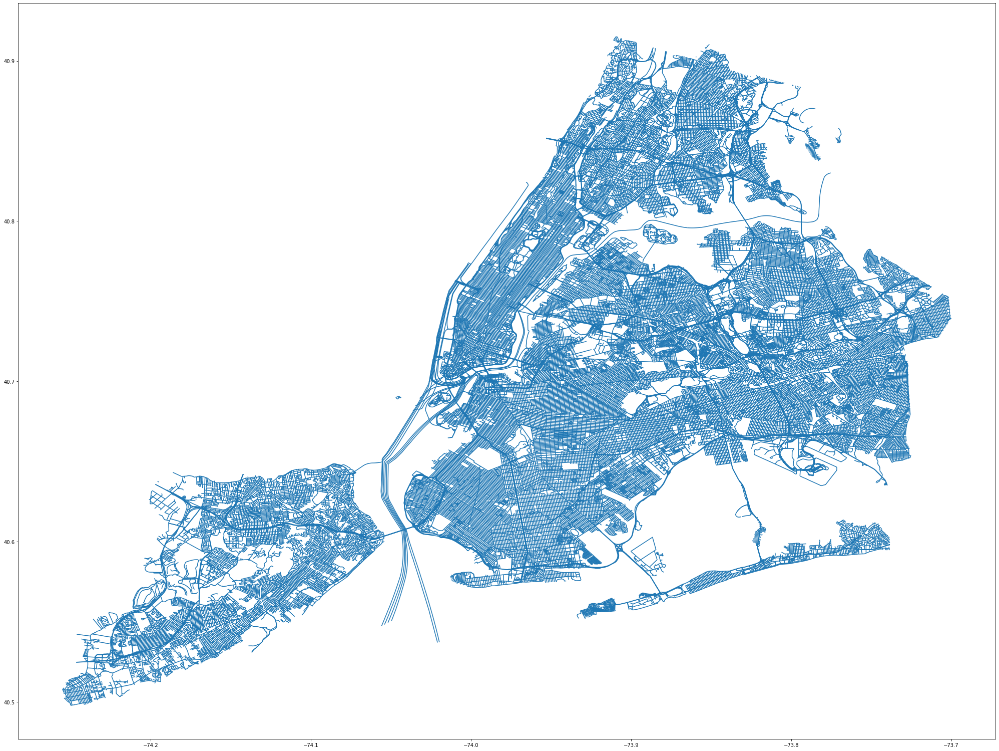

In [11]:
fig, ax = plt.subplots(figsize = (35,35))
street_map.plot(ax = ax)

###### Shp File-- Zip Codes

In [12]:
zip_map = gpd.read_file('Data/NYC_Zip.shx')

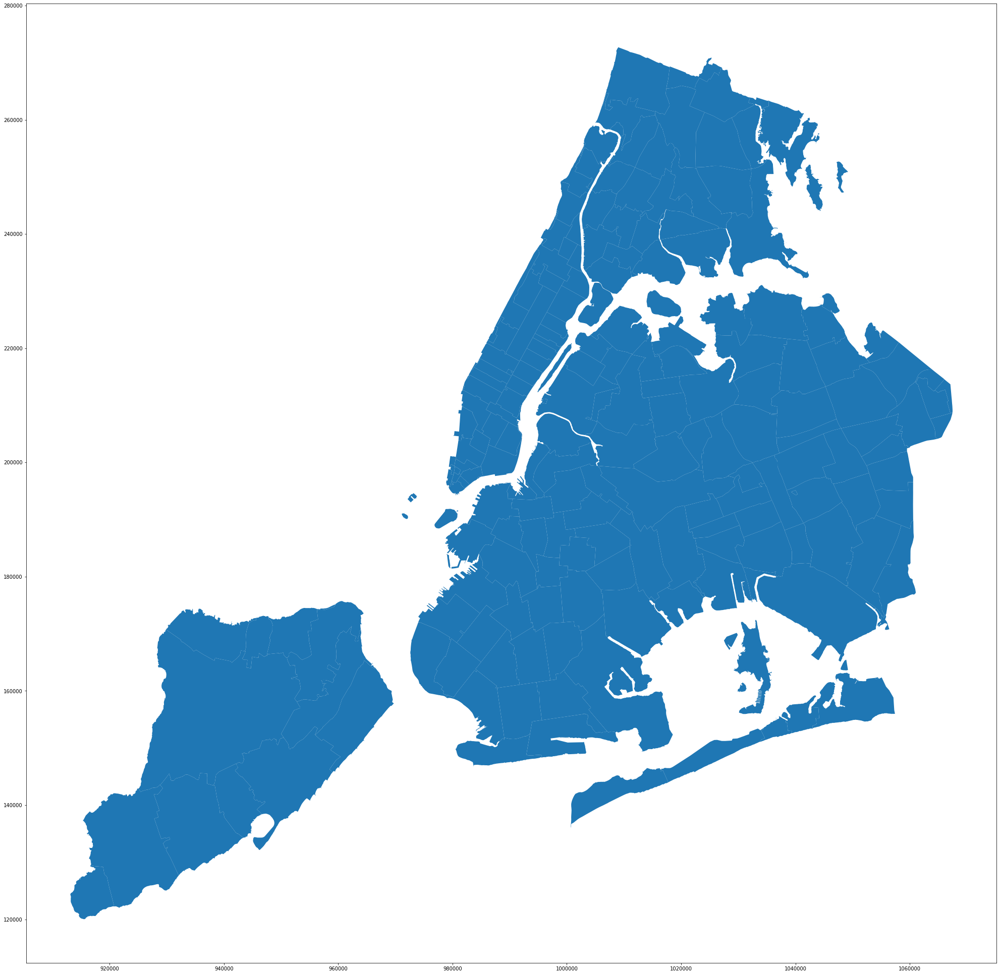

In [13]:
fig, ax = plt.subplots(figsize = (35,35))
zip_map.plot(ax = ax)

###### Shp File-- Boroughs

In [35]:
borough_map = gpd.read_file('Data/NYC_Boroughs.shp')

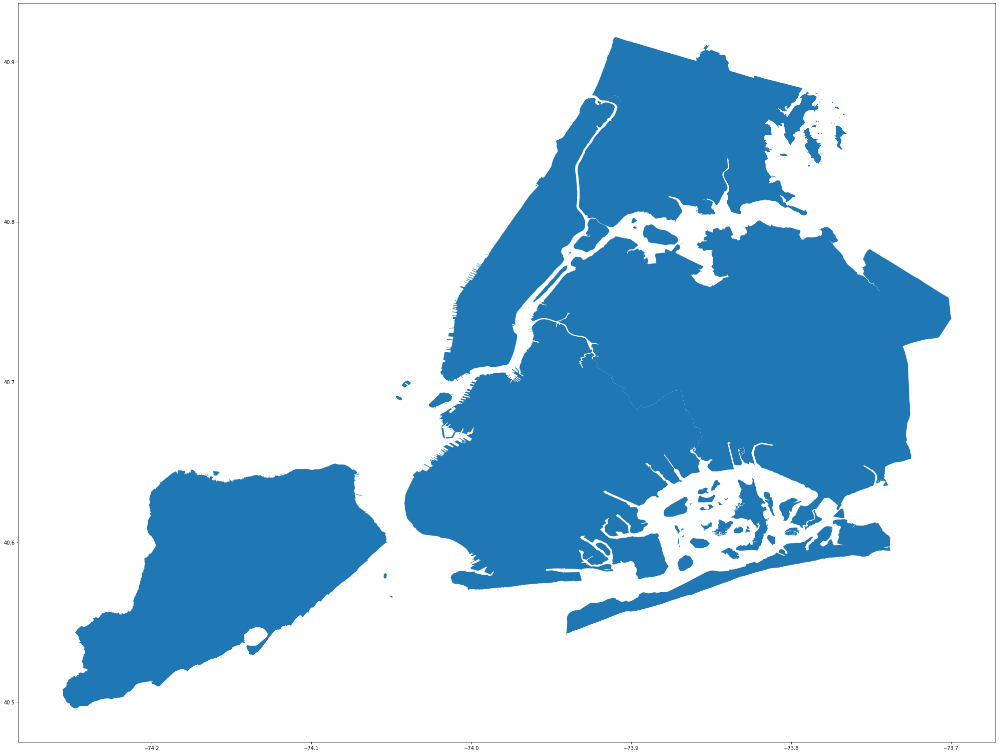

In [36]:
fig, ax = plt.subplots(figsize = (35,35))
borough_map.plot(ax = ax)

## Basic vis. attempt

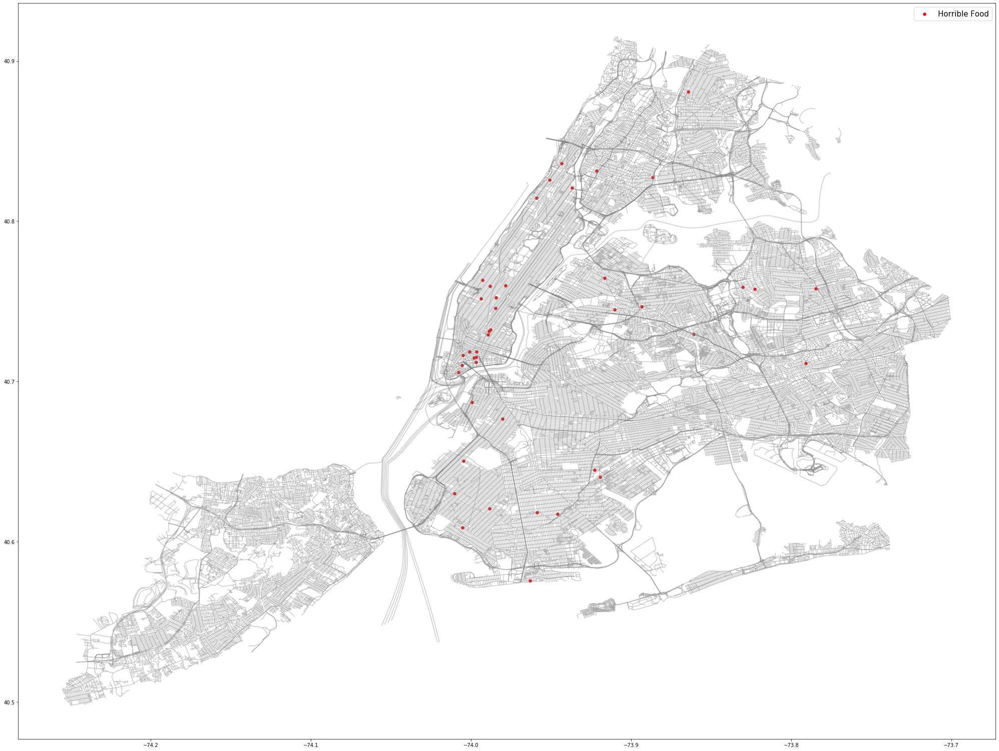

In [16]:
fig, ax = plt.subplots(figsize = (35,35))
street_map.plot(ax = ax, alpha = 0.4, color="grey")
geo_df[geo_df['Violation_Count'] > 10].plot(ax = ax, markersize = 30, color = "red", marker = "o", label = "Horrible Food")
plt.legend(prop={'size': 15})

## Restaurants with Less than 7 Violations and Restaurants with More than 7 Violations

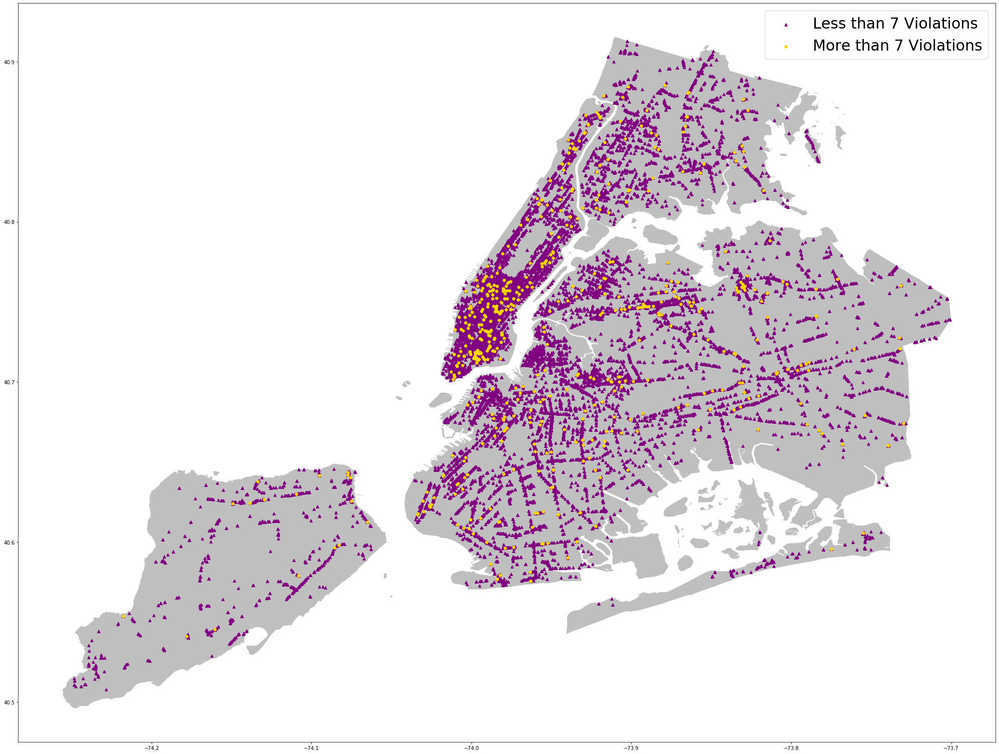

In [17]:
fig, ax = plt.subplots(figsize = (35,35))
borough_map.plot(ax = ax, alpha = 0.5, color = 'grey')
geo_df[geo_df['Violation_Count'] <= 7].plot(ax=ax, markersize = 30, color = 'purple', marker = "^", label = "Less than 7 Violations")
geo_df[geo_df['Violation_Count'] > 7].plot(ax=ax, markersize = 30, color = 'gold', marker = "o", label = "More than 7 Violations")
plt.legend(prop={'size':30})

## American Restaurants with 5 or more Violations

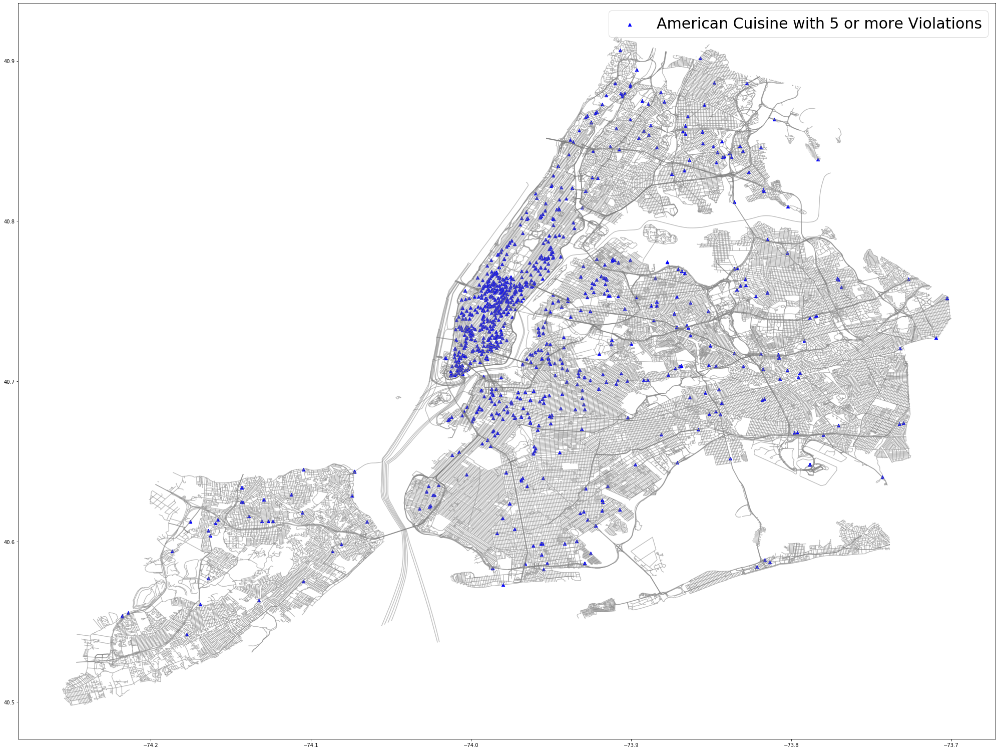

In [18]:
fig, ax = plt.subplots(figsize = (35,35))
street_map.plot(ax = ax, alpha = 0.50, color = 'grey')
geo_df[(geo_df.Cuisine_Description == 'American')  & (geo_df.Violation_Count >= 5)].plot(ax=ax, markersize = 40, color = 'blue', marker = '^', label = "American Cuisine with 5 or more Violations")
plt.legend(prop={'size':30})

## Spaital Join Example

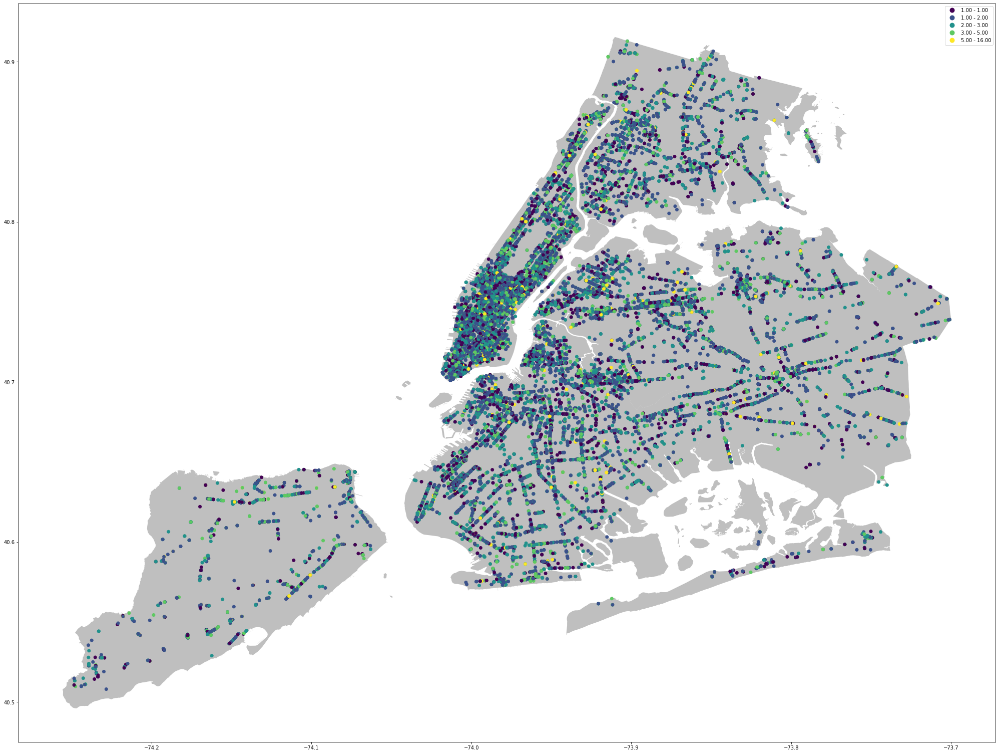

In [19]:
fig, ax = plt.subplots(figsize = (35,35))
borough_map.plot(ax = ax, alpha = 0.5, color = 'grey')
geo_df.plot(column = 'Violation_Count', ax=ax, scheme = 'fisher_jenks', legend = True)

ValueError: The input GeoDataFrame does not have a "geometry" column set.

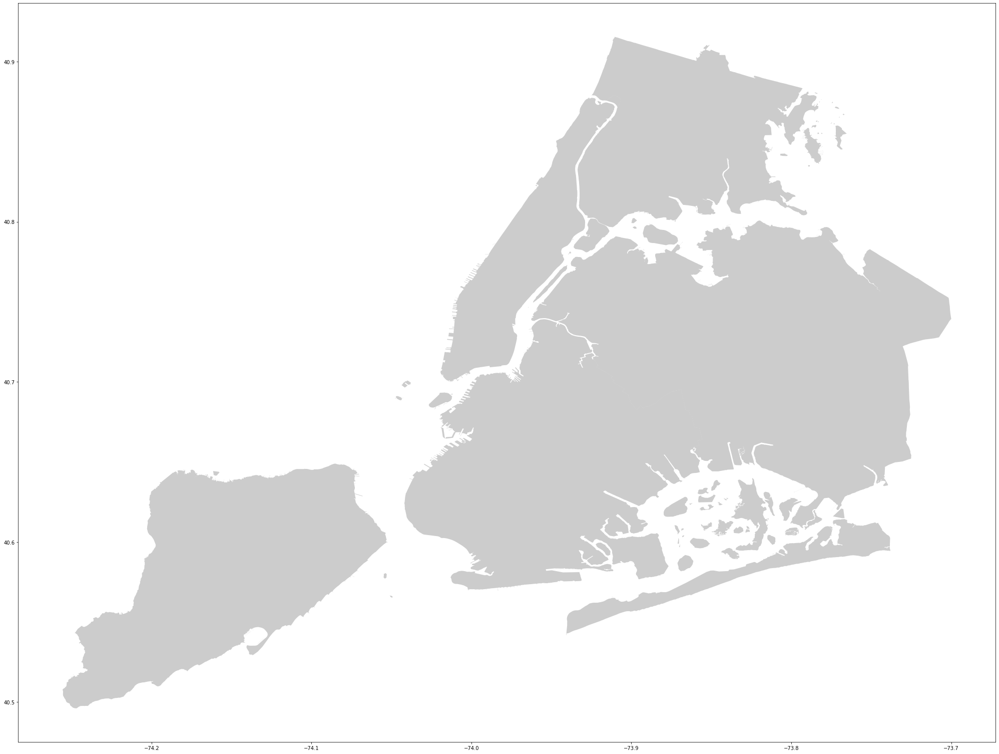

In [49]:
fig, ax = plt.subplots(figsize= (35,35))
borough_map.plot(ax = ax, alpha = 0.4, color = 'grey')
geoplot.pointplot(geo_df.Violation_Count, ax=ax, hue = "SCORE", cmap = 'inferno_r', legend = True)

## Cloropeth Map of Violation Count

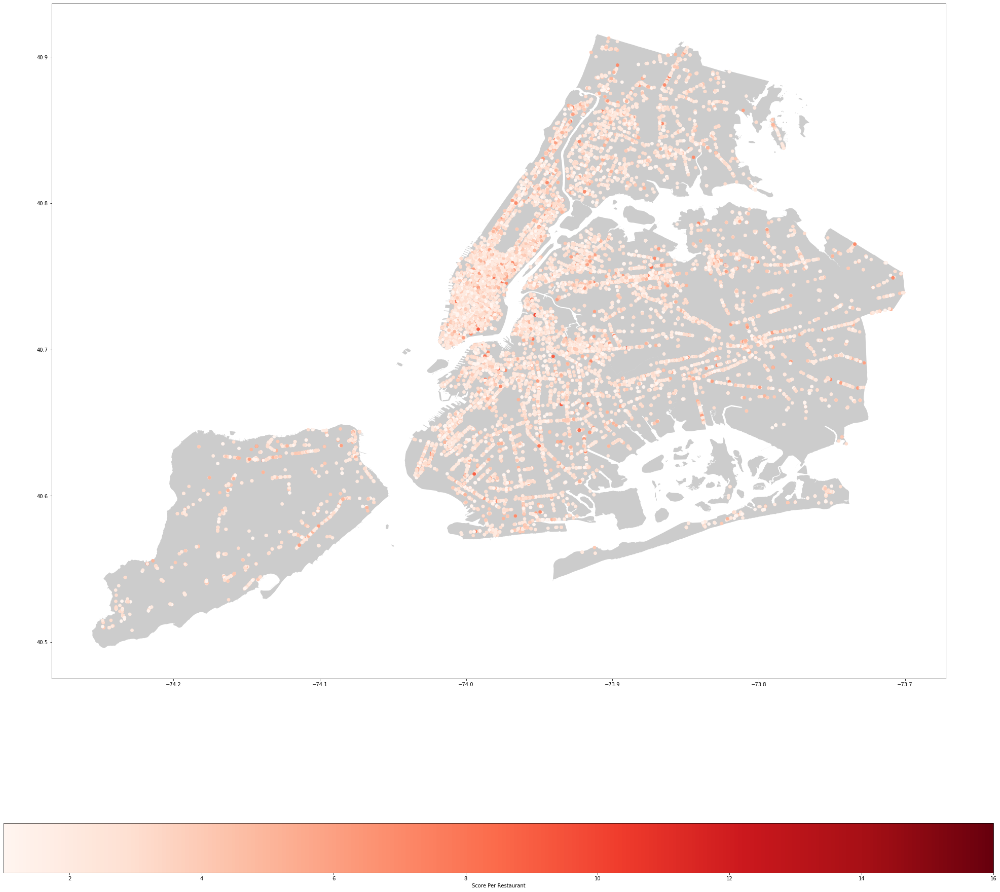

In [20]:
fig, ax = plt.subplots(figsize= (35,35))
borough_map.plot(ax = ax, alpha = 0.4, color = 'grey')
geo_df.plot(geo_df['Violation_Count'], cmap = 'Reds', linewidth = 0.8, ax = ax, legend = True, legend_kwds={'label': 'Score Per Restaurant', 'orientation': 'horizontal'})

In [14]:
df1 = df[["BORO", "Cuisine_Description","Violation_Count","Violation_Description","SCORE","GRADE"]]

In [15]:
df1

,BORO,Cuisine_Description,Violation_Count,Violation_Description,SCORE,GRADE
RESTDATE,,,,,,
5.004160e+12,Brooklyn,American,4,The original nutritional fact labels and/or in...,11,A
5.004160e+12,Brooklyn,American,3,Evidence of mice or live mice present in facil...,13,NaN
5.004160e+12,Brooklyn,American,2,"Tobacco use, eating, or drinking from open con...",7,A
4.165010e+12,Manhattan,Italian,2,Food not cooked to required minimum temperatur...,12,A
5.000250e+12,Manhattan,American,5,Facility not vermin proof. Harborage or condit...,28,NaN
...,...,...,...,...,...,...
4.171280e+12,Bronx,American,3,Evidence of rats or live rats present in facil...,12,NaN
5.000110e+12,Manhattan,American,4,Filth flies or food/refuse/sewage-associated (...,25,B
5.000110e+12,Manhattan,American,4,Letter Grade or Grade Pending card not conspic...,12,A


In [16]:
df_score = df1.groupby("BORO").SCORE.mean() # group by boro and find mean

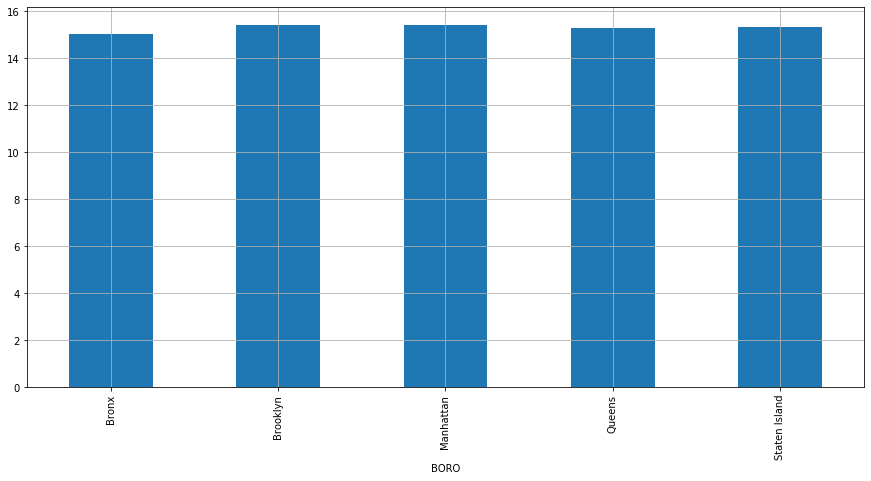

In [17]:
df_score.plot(kind="bar", grid=True, figsize=(15,7)) #graph mean boro score

In [18]:
df1.columns = df1.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')

In [19]:
df_violations = df1.groupby("boro").violation_count.mean()

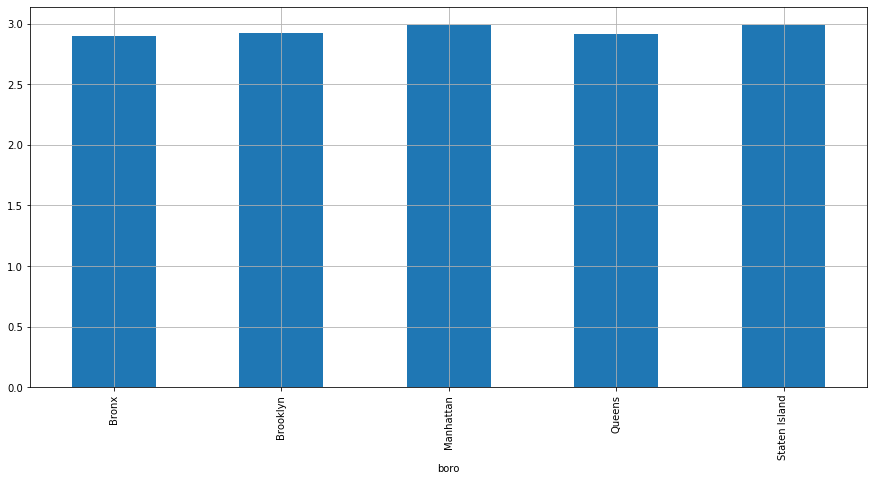

In [20]:
df_violations.plot(kind="bar", grid=True, figsize=(15,7))

In [21]:
series = df1.groupby("cuisine_description").violation_count.mean()

In [22]:
series = series.sort_values(ascending=False)
series

cuisine_description
Australian                         3.526316
Bangladeshi                        3.525773
Peruvian                           3.508197
Filipino                           3.421053
Delicatessen                       3.390411
                                     ...   
Sandwiches                         2.501880
Café/Coffee/Tea                    2.487377
Ice Cream, Gelato, Yogurt, Ices    2.480315
Hamburgers                         2.472393
Donuts                             2.310550
Name: violation_count, Length: 61, dtype: float64

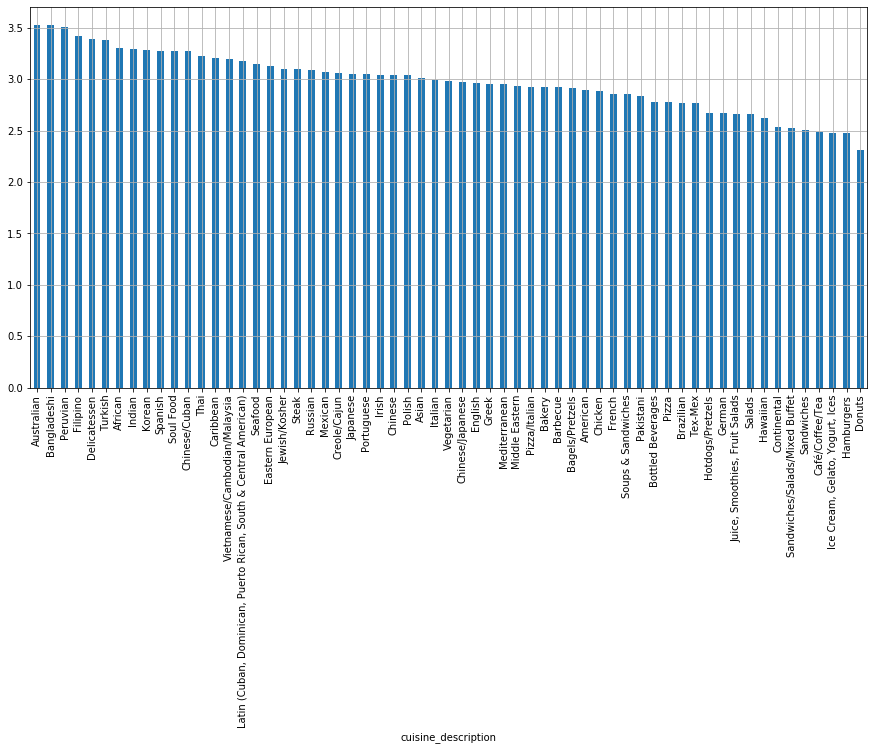

In [23]:
series.plot(kind="bar", grid=True, figsize=(15,7))

In [35]:
series1 = df1.groupby("cuisine_description").score.mean()

In [36]:
series1 = series1.sort_values(ascending=False)
series1

cuisine_description
Bangladeshi                       20.432990
Filipino                          18.736842
Soul Food                         18.491667
African                           18.464455
Peruvian                          18.349727
                                    ...    
Sandwiches/Salads/Mixed Buffet    12.578947
Sandwiches                        12.342105
Continental                       12.072464
Hamburgers                        11.593047
Donuts                            10.668648
Name: score, Length: 61, dtype: float64

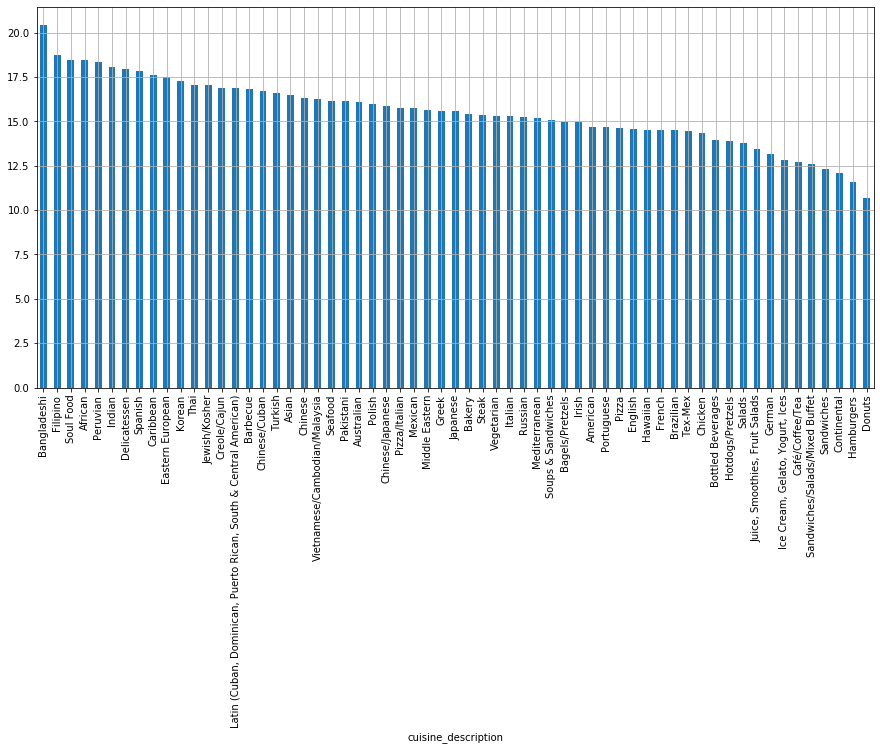

In [37]:
series1.plot(kind="bar", grid=True, figsize=(15,7))

In [38]:

df1 = df1.dropna()   

In [39]:
df1["tokens"] = df1.violation_description.apply(lambda x: nltk.word_tokenize(x))
df1["tagged_tokens"] = df1.tokens.apply(lambda x: nltk.pos_tag(x))

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [40]:
global_stopwords = nltk.corpus.stopwords.words("english")


Most Popular Words

In [43]:
counter = Counter()

for l in df1.tagged_tokens:
    word_set = set()
    
    for t in l:
        word = t[0].lower()

        if word not in global_stopwords:
            word_set.add(word)
            
    counter.update(word_set)
    
counter.most_common(30)

[('.', 27156),
 ('food', 22914),
 (',', 21668),
 ('and/or', 19003),
 ('non-food', 18702),
 ('properly', 18214),
 ('equipment', 16512),
 ('contact', 16498),
 ('maintained', 16323),
 ('surface', 16217),
 ('used', 15056),
 ('improperly', 14533),
 ('constructed', 13154),
 ('material', 13110),
 ('unacceptable', 13110),
 ('allow', 13096),
 ('raised', 13096),
 ('unit', 13096),
 ('underneath', 13096),
 ('sides', 13096),
 ('spaced', 13096),
 ('sealed', 13096),
 ('cleaning', 13096),
 ('movable', 13096),
 ('accessibility', 13096),
 ('contamination', 8347),
 ('facility', 8344),
 ('preparation', 7874),
 ('areas', 7747),
 ('present', 7512)]

Most Popular Words Adjusting for Stop Words

[('non-food', 18702),
 ('properly', 18214),
 ('equipment', 16512),
 ('contact', 16498),
 ('maintained', 16323),
 ('surface', 16217),
 ('improperly', 14533),
 ('constructed', 13154),
 ('material', 13110),
 ('unacceptable', 13110),
 ('raised', 13096),
 ('unit', 13096),
 ('underneath', 13096),
 ('sides', 13096),
 ('spaced', 13096),
 ('sealed', 13096),
 ('cleaning', 13096),
 ('movable', 13096),
 ('accessibility', 13096),
 ('contamination', 8347),
 ('facility', 8344),
 ('preparation', 7874),
 ('item', 7295),
 ('held', 7042),
 ('provided', 6749),
 ('exist', 6629),
 ('conditions', 6629),
 ('premises', 6603),
 ('use', 6534),
 ('conducive', 6521)]

<BarContainer object of 15 artists>

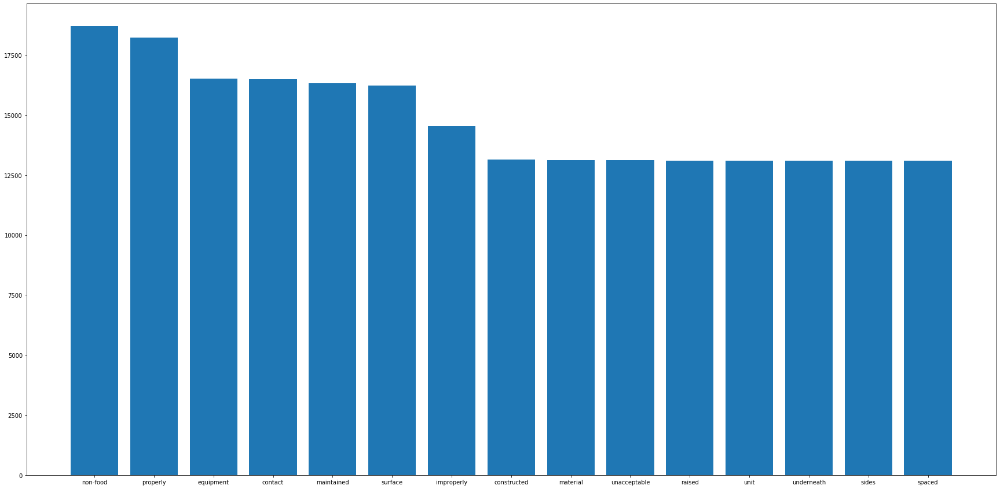

In [139]:
local_stopwords = [".","food","and/or","used","allow","areas","present",","]
counter = Counter()

for l in df1.tagged_tokens:
    word_set = set()
    
    for t in l:
        word = t[0].lower()

        if word not in (global_stopwords + local_stopwords):
            word_set.add(word)
            
    counter.update(word_set)
    
count0 = dict(counter.most_common(15))
plt.figure(figsize=(30,15))
plt.bar(count0.keys(), count0.values())

Most Popular Adjectives

<BarContainer object of 15 artists>

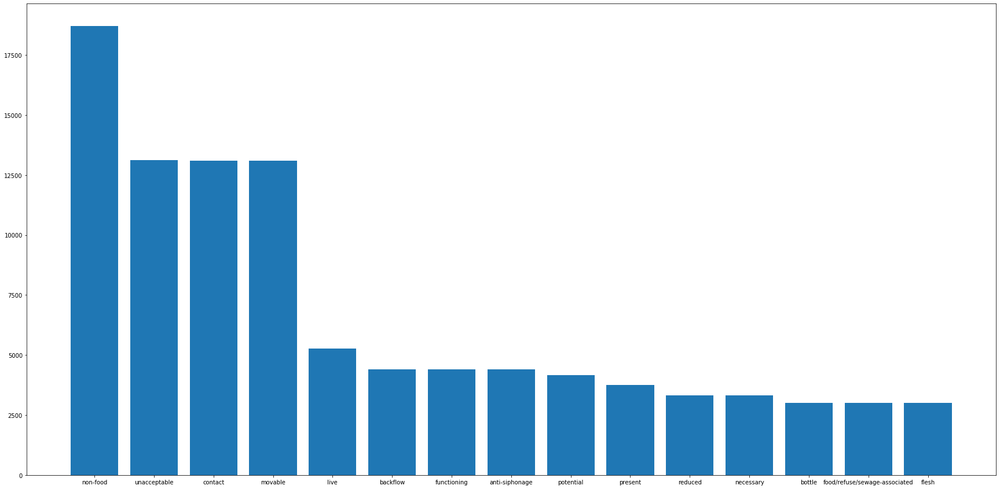

In [137]:
counter = Counter()
for l in df1.tagged_tokens:
    word_set = set()
    
    for t in l:
        word = t[0].lower()
        tag = t[1]

        if (word not in (global_stopwords + local_stopwords)) & tag.startswith("JJ"):
            word_set.add(word)
            
    counter.update(word_set)
    
count1 = dict(counter.most_common(15))
plt.figure(figsize=(30,15))
plt.bar(count1.keys(), count1.values())


Most Popular Verbs

<BarContainer object of 15 artists>

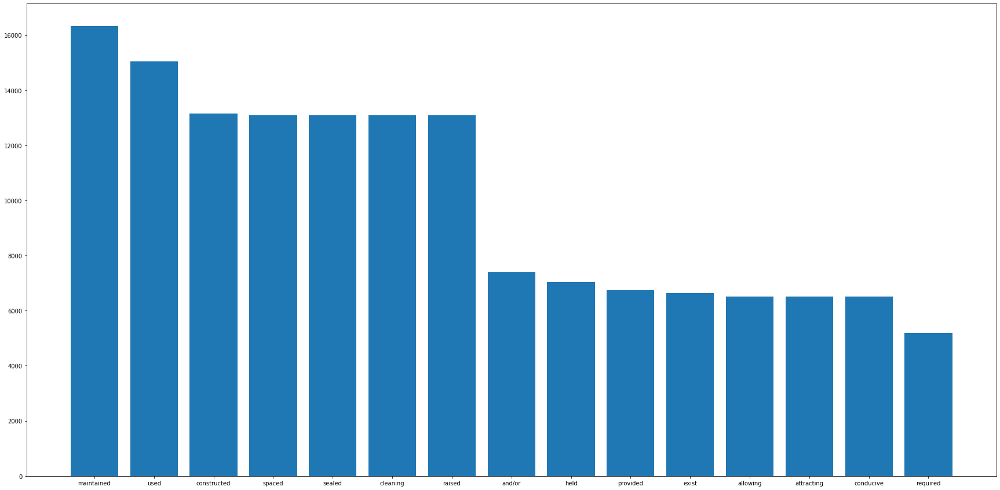

In [138]:
counter = Counter()
for l in df1.tagged_tokens:
    word_set = set()
    
    for t in l:
        word = t[0].lower()
        tag = t[1]

        if (word not in (global_stopwords + local_stopwords)) & tag.startswith("VB"):
            word_set.add(word)
            
    counter.update(word_set)
    
count2 = dict(counter.most_common(15))
plt.figure(figsize=(30,15))
plt.bar(count2.keys(), count2.values())

Determining Restaurants that have improved

In [34]:
df2 = df
df2.columns = df2.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')
df2

,dba,boro,zipcode,cuisine_description,violation_count,violation_description,score,grade,latitude,longitude,geometry
RESTDATE,,,,,,,,,,,
5004157843196,33,Brooklyn,11217,American,4,The original nutritional fact labels and/or in...,11,A,40.68688,-73.9777,POINT (-73.97770 40.68688)
5004157843148,33,Brooklyn,11217,American,3,Evidence of mice or live mice present in facil...,13,NaN,40.68688,-73.9777,POINT (-73.97770 40.68688)
5004157843427,33,Brooklyn,11217,American,2,"Tobacco use, eating, or drinking from open con...",7,A,40.68688,-73.9777,POINT (-73.97770 40.68688)
4165014943256,83.5,Manhattan,10028,Italian,2,Food not cooked to required minimum temperatur...,12,A,40.77546,-73.9521,POINT (-73.95210 40.77546)
5000245443437,1803,Manhattan,10007,American,5,Facility not vermin proof. Harborage or condit...,28,NaN,40.71522,-74.0071,POINT (-74.00710 40.71522)
...,...,...,...,...,...,...,...,...,...,...,...
4171279143113,ZYMI BAR & GRILL,Bronx,10467,American,3,Evidence of rats or live rats present in facil...,12,NaN,40.85957,-73.8663,POINT (-73.86630 40.85957)
5000106243175,ZZ CLAM BAR,Manhattan,10012,American,4,Filth flies or food/refuse/sewage-associated (...,25,B,40.72765,-74.0003,POINT (-74.00030 40.72765)
5000106243406,ZZ CLAM BAR,Manhattan,10012,American,4,Letter Grade or Grade Pending card not conspic...,12,A,40.72765,-74.0003,POINT (-74.00030 40.72765)


In [35]:
df2 = df2[["dba","boro","cuisine_description","score"]]#keep certain columns
df2 = df2.dropna() #drop rows with no score
df2["df2_score"] = df2.groupby("dba").score.diff() #group by name and find difference in scores
df2 = df2.dropna() #drop NA (restaurants with only one value)
#A higher score is worse, therefore a score over 0 means there second score was lower (they impoved), 0 means stayed the same and negative means worse second eval

In [36]:
df2_no_change =  (df2[df2.df2_score==0])#calculate restaurants with no change
len(df2_no_change)/len(df2)

0.04995291323752201

In [37]:
df2_positive = (df2[df2.df2_score>0]) #calculate restaurants that improved
len(df2_positive)/len(df2)

0.41833517585882163

In [38]:
df2_negative = df2[df2.df2_score<0] #calulate restaurants that got worse
len(df2_negative)/len(df2)

0.5317119109036564

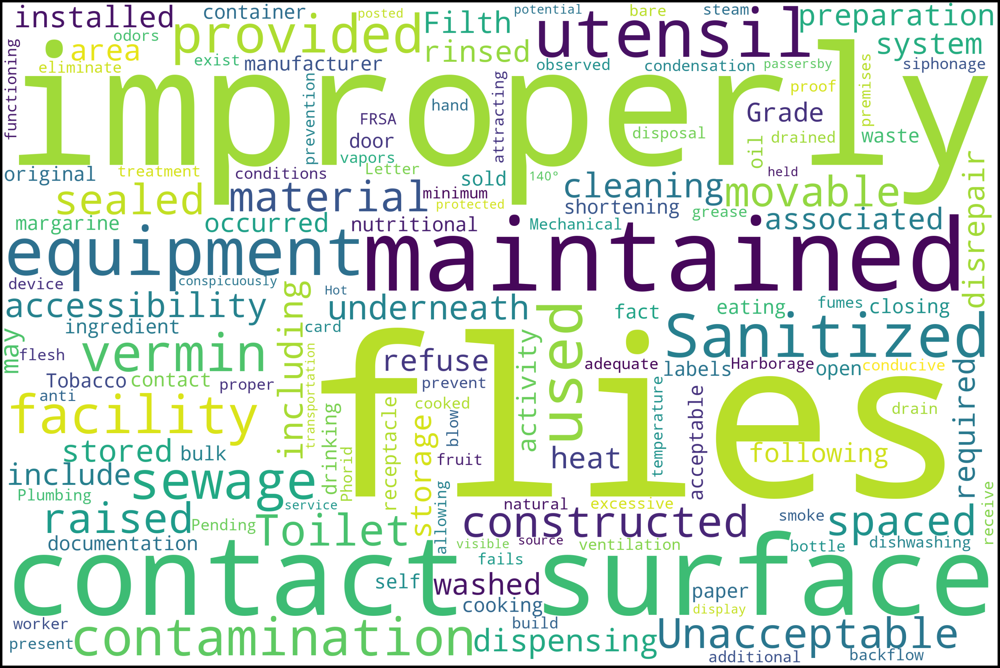

In [73]:
text = df1.violation_description.values
local_stopwords = ["food","allow","side","unit","label","items","use","little","sides","floor","site","item","house","Non","properly"]
STOPWORDS = nltk.corpus.stopwords.words("english") + local_stopwords
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [162]:
df3 = df1.copy()


In [165]:
local_stopwords = [".","food","and/or","used","allow","areas","present",","]
counter = Counter()
for i in cuisine:
    for l in df3.tagged_tokens:
        word_set = set()
    
        for t in l:
            word = t[0].lower()

            if word not in (global_stopwords + local_stopwords):
                word_set.add(word)
            
        counter.update(word_set)
counter.most_common(1)

KeyboardInterrupt: 

,boro,cuisine_description,violation_count,violation_description,score,grade,tokens,tagged_tokens
RESTDATE,,,,,,,,
5004157843196,Brooklyn,American,4,The original nutritional fact labels and/or in...,11,A,"[The, original, nutritional, fact, labels, and...","[(The, DT), (original, JJ), (nutritional, JJ),..."
5004157843427,Brooklyn,American,2,"Tobacco use, eating, or drinking from open con...",7,A,"[Tobacco, use, ,, eating, ,, or, drinking, fro...","[(Tobacco, NN), (use, NN), (,, ,), (eating, NN..."
4165014943256,Manhattan,Italian,2,Food not cooked to required minimum temperatur...,12,A,"[Food, not, cooked, to, required, minimum, tem...","[(Food, NNP), (not, RB), (cooked, VBD), (to, T..."
5000245443243,Manhattan,American,2,Non-food contact surface improperly constructe...,12,A,"[Non-food, contact, surface, improperly, const...","[(Non-food, NNP), (contact, NN), (surface, NN)..."
5008169843453,Queens,American,1,Plumbing not properly installed or maintained;...,2,A,"[Plumbing, not, properly, installed, or, maint...","[(Plumbing, VBG), (not, RB), (properly, RB), (..."
...,...,...,...,...,...,...,...,...
4171279143298,Bronx,American,3,Facility not vermin proof. Harborage or condit...,13,A,"[Facility, not, vermin, proof, ., Harborage, o...","[(Facility, NNP), (not, RB), (vermin, RB), (pr..."
4171279143180,Bronx,American,2,Facility not vermin proof. Harborage or condit...,12,A,"[Facility, not, vermin, proof, ., Harborage, o...","[(Facility, NNP), (not, RB), (vermin, RB), (pr..."
5000106243175,Manhattan,American,4,Filth flies or food/refuse/sewage-associated (...,25,B,"[Filth, flies, or, food/refuse/sewage-associat...","[(Filth, NNP), (flies, NNS), (or, CC), (food/r..."
